<a href="https://colab.research.google.com/github/Devanshu24/DL-Project/blob/main/First_Draft.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Major project for Deep Learning (CS F425)

## Generating Music with Long-Term structure
### Based on 2019 ICLR paper by Cheng-Zhi Anna Huang, Google Brain and Damon Gwinn's https://arxiv.org/abs/1809.04281



###Setup Environment and Dependencies.

In [1]:
# Clone/Install all dependencies
!git clone https://github.com/asigalov61/midi-neural-processor
!git clone https://github.com/asigalov61/MusicTransformer-Pytorch
!pip install tqdm
!pip install progress
!pip install pretty-midi
!pip install pypianoroll
!pip install matplotlib
!pip install librosa
!pip install scipy
!pip install pillow
!apt install fluidsynth #Pip does not work for some reason. Only apt works
!pip install midi2audio
!pip install mir_eval
!cp /usr/share/sounds/sf2/FluidR3_GM.sf2 /content/font.sf2

Cloning into 'midi-neural-processor'...
remote: Enumerating objects: 26, done.
remote: Total 26 (delta 0), reused 0 (delta 0), pack-reused 26
Unpacking objects: 100% (26/26), done.
Cloning into 'MusicTransformer-Pytorch'...
remote: Enumerating objects: 385, done.
remote: Total 385 (delta 0), reused 0 (delta 0), pack-reused 385
Receiving objects: 100% (385/385), 101.10 KiB | 5.05 MiB/s, done.
Resolving deltas: 100% (207/207), done.
  Created wheel for progress: filename=progress-1.6-py3-none-any.whl size=9628 sha256=99cc87cafce0d38c0c19b9cecf96ffc3b207f95ea991fe1a33ffe0cdc4b71e87
  Stored in directory: /root/.cache/pip/wheels/8e/d7/61/498d8e27dc11e9805b01eb3539e2ee344436fc226daeb5fe87
Successfully built progress
     |████████████████████████████████| 5.6 MB 10.3 MB/s 
     |████████████████████████████████| 51 kB 7.5 MB/s 
  Created wheel for pretty-midi: filename=pretty_midi-0.2.9-py3-none-any.whl size=5591953 sha256=e46d359d597763636eab041c481d830f558df9826a14badb2c0f645e8c5fb131
  S

# Import required modules

In [ ]:
# Import all needed modules
import numpy as np
import pickle
import os
import sys
import math
import random

# For plotting
import pypianoroll
from pypianoroll import Multitrack, Track
import matplotlib
import matplotlib.pyplot as plt
#matplotlib.use('SVG')
#%matplotlib inline
#matplotlib.get_backend()
import mir_eval.display
import librosa
import librosa.display

# For rendering output audio
import pretty_midi
from midi2audio import FluidSynth
from google.colab import output
from IPython.display import display, Javascript, HTML, Audio

# Download the pretrained model

In [ ]:
# Pre-trained models download (2 models trained for 100 epochs to 1.968 FLoss and 0.420 acc)
!mkdir /content/MusicTransformer-Pytorch/rprs
!mkdir /content/MusicTransformer-Pytorch/rprs/results
%cd /content/MusicTransformer-Pytorch/rprs/results
!wget 'https://superpiano.s3-us-west-1.amazonaws.com/SuperPiano3models.zip'
!unzip SuperPiano3models.zip
%cd /content/MusicTransformer-Pytorch/

/content/MusicTransformer-Pytorch/rprs/results
--2021-12-10 11:07:11--  https://superpiano.s3-us-west-1.amazonaws.com/SuperPiano3models.zip
Resolving superpiano.s3-us-west-1.amazonaws.com (superpiano.s3-us-west-1.amazonaws.com)... 52.219.24.184
Connecting to superpiano.s3-us-west-1.amazonaws.com (superpiano.s3-us-west-1.amazonaws.com)|52.219.24.184|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 109937842 (105M) [application/zip]
Saving to: ‘SuperPiano3models.zip’

SuperPiano3models.z 100%[===================>] 104.84M  47.8MB/s    in 2.2s    

2021-12-10 11:07:13 (47.8 MB/s) - ‘SuperPiano3models.zip’ saved [109937842/109937842]

Archive:  SuperPiano3models.zip
  inflating: best_acc_weights.pickle  
  inflating: best_loss_weights.pickle  
/content/MusicTransformer-Pytorch


#Lakh MIDI Dataset

### We used a subset of the [Lakh Midi dataset](https://colinraffel.com/projects/lmd/) to train our model

In [ ]:
# Create directory structure for the DataSet and prep MIDI processor

!mkdir '/content/MusicTransformer-Pytorch/dataset/e_piano/'
!mkdir '/content/MusicTransformer-Pytorch/dataset/e_piano/train'
!mkdir '/content/MusicTransformer-Pytorch/dataset/e_piano/test'
!mkdir '/content/MusicTransformer-Pytorch/dataset/e_piano/val'
!mkdir '/content/MusicTransformer-Pytorch/dataset/e_piano/custom_midis'

%cd /content/
!mv midi-neural-processor midi_processor
%cd /content/MusicTransformer-Pytorch/

mkdir: cannot create directory ‘/content/MusicTransformer-Pytorch/dataset/e_piano/’: File exists
mkdir: cannot create directory ‘/content/MusicTransformer-Pytorch/dataset/e_piano/train’: File exists
mkdir: cannot create directory ‘/content/MusicTransformer-Pytorch/dataset/e_piano/test’: File exists
mkdir: cannot create directory ‘/content/MusicTransformer-Pytorch/dataset/e_piano/val’: File exists
mkdir: cannot create directory ‘/content/MusicTransformer-Pytorch/dataset/e_piano/custom_midis’: File exists
/content
/content/MusicTransformer-Pytorch


In [ ]:
# Upload your custom MIDI DataSet to created "dataset/e_piano/custom_midis" folder through this cell or manually through any other means. You can also use ready-to-use DataSets below
from google.colab import files
%cd '/content/MusicTransformer-Pytorch/dataset/e_piano/custom_midis'
uploaded = files.upload()

for fn in uploaded.keys():
  print('User uploaded file "{name}" with length {length} bytes'.format(
      name=fn, length=len(uploaded[fn])))

/content/MusicTransformer-Pytorch/dataset/e_piano/custom_midis


KeyboardInterrupt: ignored

## Process the dataset into pickle files, and split into test/val directories

In [ ]:
# Process your custom MIDI DataSet :)
%cd /content/MusicTransformer-Pytorch
from processor import encode_midi

import os
import random



%cd '/content/MusicTransformer-Pytorch/dataset/e_piano/custom_midis'

custom_MIDI_DataSet_dir = '/content/MusicTransformer-Pytorch/dataset/e_piano/custom_midis'

train_dir = '/content/MusicTransformer-Pytorch/dataset/e_piano/train' # split_type = 0
test_dir = '/content/MusicTransformer-Pytorch/dataset/e_piano/test' # split_type = 1  
val_dir = '/content/MusicTransformer-Pytorch/dataset/e_piano/val' # split_type = 2

total_count = 0
train_count = 0
val_count   = 0
test_count  = 0

f_ext = '.pickle'
fileList = os.listdir(custom_MIDI_DataSet_dir)
for file in fileList:
     # we gonna split by a random selection for now
    
    split = random.randint(1, 2)
    if (split == 0):
         o_file = os.path.join(train_dir, file+f_ext)
         train_count += 1

    elif (split == 2):
         o_file0 = os.path.join(train_dir, file+f_ext)
         train_count += 1
         o_file = os.path.join(val_dir, file+f_ext)
         val_count += 1

    elif (split == 1):
         o_file0 = os.path.join(train_dir, file+f_ext)
         train_count += 1
         o_file = os.path.join(test_dir, file+f_ext)
         test_count += 1
    try:
      prepped = encode_midi(file)
      o_stream = open(o_file0, "wb")
      pickle.dump(prepped, o_stream)
      o_stream.close()

      prepped = encode_midi(file)
      o_stream = open(o_file, "wb")
      pickle.dump(prepped, o_stream)
      o_stream.close()
   
      print(file)
      print(o_file)
      print('Coverted!')  
    except KeyboardInterrupt: 
      raise   
    except:
      print('Bad file. Skipping...')

print('Done')
print("Num Train:", train_count)
print("Num Val:", val_count)
print("Num Test:", test_count)
print("Total Count:", train_count)

%cd /content/MusicTransformer-Pytorch

/content/MusicTransformer-Pytorch
/content/MusicTransformer-Pytorch/dataset/e_piano/custom_midis
Lay Down Sally.4.mid
/content/MusicTransformer-Pytorch/dataset/e_piano/val/Lay Down Sally.4.mid.pickle
Coverted!
La mia faccia.mid
/content/MusicTransformer-Pytorch/dataset/e_piano/test/La mia faccia.mid.pickle
Coverted!
Kim.mid
/content/MusicTransformer-Pytorch/dataset/e_piano/test/Kim.mid.pickle
Coverted!
Let It Be Me.mid
/content/MusicTransformer-Pytorch/dataset/e_piano/test/Let It Be Me.mid.pickle
Coverted!
La Isla Bonita.4.mid
/content/MusicTransformer-Pytorch/dataset/e_piano/val/La Isla Bonita.4.mid.pickle
Coverted!


/usr/local/lib/python3.7/dist-packages/pretty_midi/pretty_midi.py:101: RuntimeWarning: Tempo, Key or Time signature change events found on non-zero tracks.  This is not a valid type 0 or type 1 MIDI file.  Tempo, Key or Time Signature may be wrong.
  RuntimeWarning)


Knock Me Down.mid
/content/MusicTransformer-Pytorch/dataset/e_piano/val/Knock Me Down.mid.pickle
Coverted!
Le Freak.1.mid
/content/MusicTransformer-Pytorch/dataset/e_piano/test/Le Freak.1.mid.pickle
Coverted!
La Woman.mid
/content/MusicTransformer-Pytorch/dataset/e_piano/val/La Woman.mid.pickle
Coverted!
Le Roi boiteux.mid
/content/MusicTransformer-Pytorch/dataset/e_piano/test/Le Roi boiteux.mid.pickle
Coverted!
Le Bistrot.mid
/content/MusicTransformer-Pytorch/dataset/e_piano/val/Le Bistrot.mid.pickle
Coverted!
La Solitudine.mid
/content/MusicTransformer-Pytorch/dataset/e_piano/val/La Solitudine.mid.pickle
Coverted!
Kill You.mid
/content/MusicTransformer-Pytorch/dataset/e_piano/val/Kill You.mid.pickle
Coverted!
Le Jazz Hot.mid
/content/MusicTransformer-Pytorch/dataset/e_piano/val/Le Jazz Hot.mid.pickle
Coverted!
Leningrad.2.mid
/content/MusicTransformer-Pytorch/dataset/e_piano/test/Leningrad.2.mid.pickle
Coverted!
Keyboard Sonata in G major, Hob. XVI_8_ IV. Allegro.mid
/content/MusicTr

#Train the Model

In [ ]:
#@title Activate Tensorboard Graphs/Stats to monitor/evaluate model perfomance during and after training runs
# Load the TensorBoard notebook extension
%reload_ext tensorboard
import tensorflow as tf
import datetime, os
%tensorboard --logdir /content/MusicTransformer-Pytorch/rpr

<IPython.core.display.Javascript object>

In [ ]:
#@title Start to Train the Model
batch_size = 2 #@param {type:"slider", min:0, max:8, step:1}
number_of_training_epochs = 101 #@param {type:"slider", min:0, max:200, step:1}
maximum_output_MIDI_sequence = 2048 #@param {type:"slider", min:0, max:8192, step:128}
!python3 /content/MusicTransformer-Pytorch/train.py -output_dir "/content/drive/MyDrive/Sem 3-1/dl/rpr" --rpr -batch_size=$batch_size -epochs=$number_of_training_epochs -max_sequence=$maximum_output_MIDI_sequence -input_dir /content/MusicTransformer-Pytorch/dataset/e_piano #-n_layers -num_heads -d_model -dim_feedforward

Streaming output truncated to the last 5000 lines.
Epoch 21  Batch 210 / 255
LR: 0.0006064817809787312
Train loss: 1.7441298961639404

Time (s): 1.3456542491912842

Epoch 21  Batch 211 / 255
LR: 0.0006064246815311651
Train loss: 1.9656223058700562

Time (s): 1.3473026752471924

Epoch 21  Batch 212 / 255
LR: 0.0006063675982080725
Train loss: 0.6886943578720093

Time (s): 1.351503610610962

Epoch 21  Batch 213 / 255
LR: 0.0006063105310018657
Train loss: 0.9062964916229248

Time (s): 1.3530197143554688

Epoch 21  Batch 214 / 255
LR: 0.000606253479904962
Train loss: 1.293546199798584

Time (s): 1.3538222312927246

Epoch 21  Batch 215 / 255
LR: 0.0006061964449097837
Train loss: 1.3615143299102783

Time (s): 1.3476901054382324

Epoch 21  Batch 216 / 255
LR: 0.0006061394260087584
Train loss: 1.3849742412567139

Time (s): 1.3459770679473877

Epoch 21  Batch 217 / 255
LR: 0.0006060824231943184
Train loss: 1.3008980751037598

Time (s): 1.3521506786346436

Epoch 21  Batch 218 / 255
LR: 0.00060602

In [ ]:
#@title Re-Start Training from a certain checkpoint and epoch
batch_size = 2 #@param {type:"slider", min:0, max:8, step:1}
number_of_training_epochs = 101 #@param {type:"slider", min:0, max:200, step:1}
maximum_output_MIDI_sequence = 2048 #@param {type:"slider", min:0, max:8192, step:128}
saved_checkpoint_full_path = "/content/MusicTransformer-Pytorch/rpr/weights/epoch_0023.pickle" #@param {type:"string"}
continue_epoch_number =  23#@param {type:"integer"}

!python3 train.py -output_dir "/content/drive/MyDrive/Sem 3-1/dl/rpr2" --rpr -batch_size=$batch_size -epochs=$number_of_training_epochs -max_sequence=$maximum_output_MIDI_sequence -continue_weights $saved_checkpoint_full_path -continue_epoch $continue_epoch_number #-n_layers -num_heads -d_model -dim_feedforward

Streaming output truncated to the last 5000 lines.
Epoch 31  Batch 174 / 255
LR: 0.0004996324057742807
Train loss: 1.5493133068084717

Time (s): 1.0018658638000488

Epoch 31  Batch 175 / 255
LR: 0.0004996004793608947
Train loss: 1.945560336112976

Time (s): 0.9966986179351807

Epoch 31  Batch 176 / 255
LR: 0.0004995685590670014
Train loss: 0.4420439302921295

Time (s): 1.0017659664154053

Epoch 31  Batch 177 / 255
LR: 0.0004995366448906461
Train loss: 1.262708067893982

Time (s): 1.000500202178955

Epoch 31  Batch 178 / 255
LR: 0.0004995047368298751
Train loss: 1.7101283073425293

Time (s): 0.998708963394165

Epoch 31  Batch 179 / 255
LR: 0.0004994728348827355
Train loss: 1.149751901626587

Time (s): 1.0083887577056885

Epoch 31  Batch 180 / 255
LR: 0.0004994409390472751
Train loss: 1.4155871868133545

Time (s): 1.0106620788574219

Epoch 31  Batch 181 / 255
LR: 0.0004994090493215429
Train loss: 1.421881079673767

Time (s): 1.0148868560791016

Epoch 31  Batch 182 / 255
LR: 0.00049937716

###Evaluate the resulted models

In [ ]:
#@title Evaluate Best Resulting Accuracy Model (best_acc_weights.pickle)
!python3 evaluate.py -model_weights rpr/results/best_acc_weights.pickle --rpr

dataset_dir: ./dataset/e_piano
model_weights: rpr/results/best_acc_weights.pickle
n_workers: 1
force_cpu: False

batch_size: 2

rpr: True
max_sequence: 2048
n_layers: 6
num_heads: 8
d_model: 512

dim_feedforward: 1024

Evaluating:
Avg loss: 1.4482005080351463
Avg acc: 0.6057841048790858



In [ ]:
#@title Evaluate Best Resulting Loss Model (best_loss_weights.pickle)
!python3 evaluate.py -model_weights rpr/results/best_loss_weights.pickle --rpr

dataset_dir: ./dataset/e_piano
model_weights: rpr/results/best_loss_weights.pickle
n_workers: 1
force_cpu: False

batch_size: 2

rpr: True
max_sequence: 2048
n_layers: 6
num_heads: 8
d_model: 512

dim_feedforward: 1024

Evaluating:
Avg loss: 1.4387735375991235
Avg acc: 0.6089907515507478



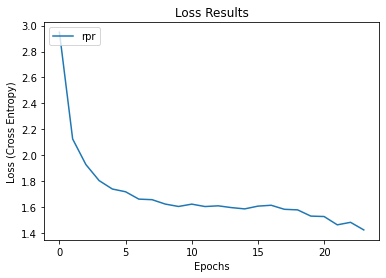

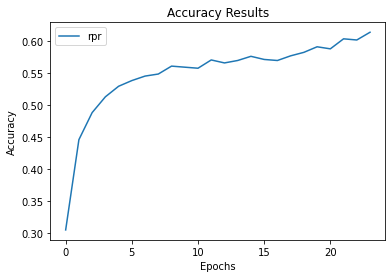

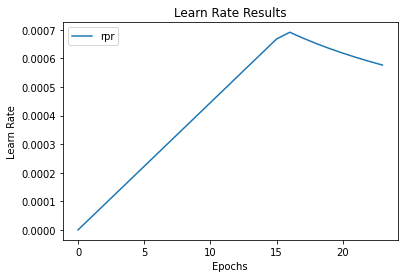

In [ ]:
#@title Graph the results
import argparse
import os
import csv
import math
import matplotlib.pyplot as plt

RESULTS_FILE = "results.csv"
EPOCH_IDX = 0
LR_IDX = 1
EVAL_LOSS_IDX = 4
EVAL_ACC_IDX = 5

SPLITTER = '?'


def graph_results(input_dirs="/content/MusicTransformer-Pytorch/rpr/results", output_dir=None, model_names=None, epoch_start=0, epoch_end=None):
    """
    ----------
    Author: Damon Gwinn
    ----------
    Graphs model training and evaluation data
    ----------
    """

    input_dirs = input_dirs.split(SPLITTER)

    if(model_names is not None):
        model_names = model_names.split(SPLITTER)
        if(len(model_names) != len(input_dirs)):
            print("Error: len(model_names) != len(input_dirs)")
            return

    #Initialize Loss and Accuracy arrays
    loss_arrs = []
    accuracy_arrs = []
    epoch_counts = []
    lrs = []

    for input_dir in input_dirs:
        loss_arr = []
        accuracy_arr = []
        epoch_count = []
        lr_arr = []

        f = os.path.join(input_dir, RESULTS_FILE)
        with open(f, "r") as i_stream:
            reader = csv.reader(i_stream)
            next(reader)

            lines = [line for line in reader]

        if(epoch_end is None):
            epoch_end = math.inf

        epoch_start = max(epoch_start, 0)
        epoch_start = min(epoch_start, epoch_end)

        for line in lines:
            epoch = line[EPOCH_IDX]
            lr = line[LR_IDX]
            accuracy = line[EVAL_ACC_IDX]
            loss = line[EVAL_LOSS_IDX]

            if(int(epoch) >= epoch_start and int(epoch) < epoch_end):
                accuracy_arr.append(float(accuracy))
                loss_arr.append(float(loss))
                epoch_count.append(int(epoch))
                lr_arr.append(float(lr))

        loss_arrs.append(loss_arr)
        accuracy_arrs.append(accuracy_arr)
        epoch_counts.append(epoch_count)
        lrs.append(lr_arr)

    if(output_dir is not None):
        try:
            os.mkdir(output_dir)
        except OSError:
            print ("Creation of the directory %s failed" % output_dir)
        else:
            print ("Successfully created the directory %s" % output_dir)

    ##### LOSS #####
    for i in range(len(loss_arrs)):
        if(model_names is None):
            name = None
        else:
            name = model_names[i]

        #Create and save plots to output folder
        plt.plot(epoch_counts[i], loss_arrs[i], label=name)
        plt.title("Loss Results")
        plt.ylabel('Loss (Cross Entropy)')
        plt.xlabel('Epochs')
        fig1 = plt.gcf()

    plt.legend(loc="upper left")

    if(output_dir is not None):
        fig1.savefig(os.path.join(output_dir, 'loss_graph.png'))

    plt.show()

    ##### ACCURACY #####
    for i in range(len(accuracy_arrs)):
        if(model_names is None):
            name = None
        else:
            name = model_names[i]

        #Create and save plots to output folder
        plt.plot(epoch_counts[i], accuracy_arrs[i], label=name)
        plt.title("Accuracy Results")
        plt.ylabel('Accuracy')
        plt.xlabel('Epochs')
        fig2 = plt.gcf()

    plt.legend(loc="upper left")

    if(output_dir is not None):
        fig2.savefig(os.path.join(output_dir, 'accuracy_graph.png'))

    plt.show()

    ##### LR #####
    for i in range(len(lrs)):
        if(model_names is None):
            name = None
        else:
            name = model_names[i]

        #Create and save plots to output folder
        plt.plot(epoch_counts[i], lrs[i], label=name)
        plt.title("Learn Rate Results")
        plt.ylabel('Learn Rate')
        plt.xlabel('Epochs')
        fig2 = plt.gcf()

    plt.legend(loc="upper left")

    if(output_dir is not None):
        fig2.savefig(os.path.join(output_dir, 'lr_graph.png'))

    plt.show()
graph_results('/content/MusicTransformer-Pytorch/rpr/results', model_names='rpr')

To have the model continue your custom MIDI enter the following into the custom_MIDI field below:

-primer_file '/content/some_dir/some_seed_midi.mid'

For example: -primer_file '/content/MusicTransformer-Pytorch/seed.mid'

# Generate and Explore the output

In [ ]:
!mv "/content/A Farewell to Kings.mid" /content/aftk.mid

In [ ]:
#@title Generate, Plot, Graph, Save, Download, and Render the resulting output
number_of_tokens_to_generate = 1023 #@param {type:"slider", min:1, max:2048, step:1}
priming_sequence_length = 65 #@param {type:"slider", min:1, max:2048, step:8}
maximum_possible_output_sequence = 2048 #@param {type:"slider", min:0, max:2048, step:8}
select_model = "/content/MusicTransformer-Pytorch/rprs/results/best_acc_weights.pickle" #@param ["/content/MusicTransformer-Pytorch/rpr/results/best_acc_weights.pickle", "/content/MusicTransformer-Pytorch/rpr/results/best_loss_weights.pickle", "/content/MusicTransformer-Pytorch/rprs/results/best_acc_weights.pickle"]
custom_MIDI = "/content/aftk.mid" #@param {type:"string"}

import processor
from processor import encode_midi, decode_midi

!python generate.py -output_dir output -model_weights=$select_model --rpr -target_seq_length=$number_of_tokens_to_generate -num_prime=$priming_sequence_length -max_sequence=$maximum_possible_output_sequence -primer_file=$custom_MIDI #

print('Successfully exported the output to output folder. To primer.mid and rand.mid')

# set the src and play
FluidSynth("/content/font.sf2").midi_to_audio('/content/MusicTransformer-Pytorch/output/rand.mid', '/content/MusicTransformer-Pytorch/output/output.wav')

from google.colab import files
files.download('/content/MusicTransformer-Pytorch/output/rand.mid')
files.download('/content/MusicTransformer-Pytorch/output/primer.mid')

Audio('/content/MusicTransformer-Pytorch/output/output.wav')


midi_root: ./dataset/e_piano/
output_dir: output
primer_file: /content/aftk.mid
force_cpu: False

target_seq_length: 1023
num_prime: 65
model_weights: /content/MusicTransformer-Pytorch/rprs/results/best_acc_weights.pickle
beam: 0

rpr: True
max_sequence: 2048
n_layers: 6
num_heads: 8
d_model: 512

dim_feedforward: 1024

Using primer file: /content/aftk.mid
RAND DIST
Generating sequence of max length: 1023
100 / 1023
150 / 1023
200 / 1023
250 / 1023
300 / 1023
350 / 1023
400 / 1023
450 / 1023
500 / 1023
550 / 1023
600 / 1023
650 / 1023
700 / 1023
750 / 1023
800 / 1023
850 / 1023
900 / 1023
950 / 1023
1000 / 1023
info removed pitch: 92
info removed pitch: 58
info removed pitch: 70
Successfully exported the output to output folder. To primer.mid and rand.mid


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

The above output was generated by using 1 second of [A Farewell to Kings.mid](https://github.com/Devanshu24/DL-Project/blob/main/A%20Farewell%20to%20Kings.mid) as a primer

In [ ]:
#@title Plot and Graph the Output :)
graphs_length_inches = 18 #@param {type:"slider", min:0, max:20, step:1}
notes_graph_height = 6 #@param {type:"slider", min:0, max:20, step:1}
highest_displayed_pitch = 92 #@param {type:"slider", min:1, max:128, step:1}
lowest_displayed_pitch = 24 #@param {type:"slider", min:1, max:128, step:1}
piano_roll_color_map = "Blues"

import librosa
import numpy as np
import pretty_midi
import pypianoroll
from pypianoroll import Multitrack, Track
import matplotlib
import matplotlib.pyplot as plt
#matplotlib.use('SVG')
# For plotting
import mir_eval.display
import librosa.display
%matplotlib inline


midi_data = pretty_midi.PrettyMIDI('/content/MusicTransformer-Pytorch/output/rand.mid')

def plot_piano_roll(pm, start_pitch, end_pitch, fs=100):
    # Use librosa's specshow function for displaying the piano roll
    librosa.display.specshow(pm.get_piano_roll(fs)[start_pitch:end_pitch],
                             hop_length=1, sr=fs, x_axis='time', y_axis='cqt_note',
                             fmin=pretty_midi.note_number_to_hz(start_pitch))



roll = np.zeros([int(graphs_length_inches), 128])
# Plot the output

track = Multitrack('/content/MusicTransformer-Pytorch/output/rand.mid', name='track')
plt.figure(figsize=[graphs_length_inches, notes_graph_height])
fig, ax = track.plot()
fig.set_size_inches(graphs_length_inches, notes_graph_height)
plt.figure(figsize=[graphs_length_inches, notes_graph_height])
ax2 = plot_piano_roll(midi_data, int(lowest_displayed_pitch), int(highest_displayed_pitch))
plt.show(block=False)

TypeError: ignored

### Save to Google Drive (Standard GD connect code)

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# Reload weights and dataset from Drive

We saved the processed dataset and the trained model to Google Drive for easy access. The following cells contain code to reload them:

In [ ]:
!du /content/MusicTransformer-Pytorch/dataset/e_piano -h

12M	/content/MusicTransformer-Pytorch/dataset/e_piano/val
23M	/content/MusicTransformer-Pytorch/dataset/e_piano/custom_midis
13M	/content/MusicTransformer-Pytorch/dataset/e_piano/test
24M	/content/MusicTransformer-Pytorch/dataset/e_piano/train
70M	/content/MusicTransformer-Pytorch/dataset/e_piano


In [ ]:
!cp "/content/drive/MyDrive/Sem 3-1/dl/rpr" /content/MusicTransformer-Pytorch/ -r

In [ ]:
!cp "/content/drive/MyDrive/Sem 3-1/dl/e_piano" /content/MusicTransformer-Pytorch/dataset/ -r